In [20]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import seaborn as sns
#import plotly.express as px

from pandas_profiling import ProfileReport
from xgboost import XGBClassifier
from xgboost import plot_importance

# Scikit-learn packages
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer, OrdinalEncoder
from sklearn.compose import ColumnTransformer

## Import helper functions
from ipynb.fs.defs.utils import *

In [21]:
KAGGLE_EVAL_METRIC = 'logloss' # string name for loss function in xgboost

In [22]:
TRAIN_PATH = "data/train.csv"
TEST_PATH = "data/test.csv"

In [23]:
TARGET = ["rain_tomorrow"]

In [58]:
combined = train.append(test)

# Load Data

In [24]:
train = pd.read_csv(TRAIN_PATH)
test = pd.read_csv(TEST_PATH)

In [25]:
train.head()

,id,date,location,min_temp,max_temp,rainfall,evaporation,sunshine,wind_gust_dir,wind_gust_speed,...,humidity9am,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,rain_today,rain_tomorrow
0,6364,2010-11-11,BadgerysCreek,16.2,28.9,11.4,NaN,NaN,SW,37.0,...,78.0,52.0,1017.2,1011.7,NaN,NaN,20.3,27.9,1.0,0
1,7985,2011-03-09,Sale,14.6,28.3,0.0,NaN,NaN,SSE,35.0,...,81.0,65.0,1012.9,1010.4,7.0,7.0,19.0,24.4,0.0,1
2,5021,2014-06-06,Nhil,2.6,16.3,0.0,NaN,NaN,S,31.0,...,93.0,61.0,1033.1,1031.0,NaN,NaN,5.9,14.6,0.0,0
3,28546,2017-06-07,Townsville,14.0,25.9,0.0,NaN,NaN,WNW,35.0,...,66.0,37.0,1020.4,1016.9,NaN,NaN,20.9,24.7,0.0,0
4,42222,2016-12-13,Uluru,16.7,41.7,0.0,NaN,NaN,SW,61.0,...,17.0,7.0,1006.1,1002.6,NaN,NaN,33.2,41.1,0.0,0


In [28]:
train.date.describe()

count          34191
unique          3253
top       2017-02-18
freq              23
Name: date, dtype: object

In [30]:
# Date preproccessing

In [29]:
train['date'] = pd.to_datetime(train['date'])


In [32]:
train['date'] = pd.to_datetime(train['date'])
train['year'] = train['date'].dt.year
train['day'] = train['date'].dt.day
train['month'] = train['date'].dt.month
train['dayofyear'] = train['date'].dt.dayofyear

In [ ]:
# Temp feature engineering

In [41]:
train ['temp_change'] = train['max_temp'] - train['min_temp']

In [ ]:
## Location feature engineering

In [60]:
temp_count = combined[['location','rain_today']].groupby(['location'], as_index=False).count()
temp_sum = combined[['location','rain_today']].groupby(['location'], as_index=False).sum()
rain_location = temp_count.merge(temp_sum, on='location')
rain_location['prob'] = rain_location['rain_today_y'] / rain_location['rain_today_x']
rain_location[['location','prob']].merge(combined, on='location')
combined = rain_location[['location','prob']].merge(combined, on='location')

In [66]:
combined.shape

(48844, 29)

In [42]:
train.head()

,id,date,location,min_temp,max_temp,rainfall,evaporation,sunshine,wind_gust_dir,wind_gust_speed,...,cloud3pm,temp9am,temp3pm,rain_today,rain_tomorrow,year,day,month,dayofyear,temp_change
0,6364,2010-11-11,BadgerysCreek,16.2,28.9,11.4,NaN,NaN,SW,37.0,...,NaN,20.3,27.9,1.0,0,2010,11,315,315,12.7
1,7985,2011-03-09,Sale,14.6,28.3,0.0,NaN,NaN,SSE,35.0,...,7.0,19.0,24.4,0.0,1,2011,9,68,68,13.7
2,5021,2014-06-06,Nhil,2.6,16.3,0.0,NaN,NaN,S,31.0,...,NaN,5.9,14.6,0.0,0,2014,6,157,157,13.7
3,28546,2017-06-07,Townsville,14.0,25.9,0.0,NaN,NaN,WNW,35.0,...,NaN,20.9,24.7,0.0,0,2017,7,158,158,11.9
4,42222,2016-12-13,Uluru,16.7,41.7,0.0,NaN,NaN,SW,61.0,...,NaN,33.2,41.1,0.0,0,2016,13,348,348,25.0


In [36]:
train[train['location'] == 'Sale'].sort_values(by='date')

,id,date,location,min_temp,max_temp,rainfall,evaporation,sunshine,wind_gust_dir,wind_gust_speed,...,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,rain_today,rain_tomorrow,year,day,month
27158,38815,2009-01-04,Sale,6.7,24.3,0.0,NaN,NaN,ESE,33.0,...,1013.4,3.0,5.0,16.4,23.2,0.0,0,2009,4,1
19800,33047,2009-01-21,Sale,12.0,27.2,0.0,NaN,NaN,ESE,41.0,...,1007.8,3.0,3.0,19.4,24.6,0.0,0,2009,21,1
6583,601,2009-01-23,Sale,15.2,24.0,1.2,NaN,NaN,E,43.0,...,1004.5,2.0,2.0,18.0,22.5,1.0,1,2009,23,1
24104,26840,2009-01-24,Sale,13.2,23.7,1.2,NaN,NaN,WNW,76.0,...,1009.9,7.0,3.0,18.5,22.7,1.0,0,2009,24,1
33721,47609,2009-02-01,Sale,18.7,22.3,0.8,NaN,False,ESE,44.0,...,1019.3,8.0,8.0,18.8,19.6,0.0,0,2009,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10716,2677,2017-06-07,Sale,2.4,13.7,3.0,NaN,NaN,NaN,NaN,...,1028.9,8.0,NaN,6.0,12.6,1.0,0,2017,7,6
33149,28700,2017-06-09,Sale,4.5,14.9,0.0,NaN,NaN,NaN,NaN,...,1032.3,NaN,7.0,7.5,13.8,0.0,0,2017,9,6
8598,47004,2017-06-16,Sale,1.0,16.9,0.2,NaN,NaN,NaN,NaN,...,1024.2,NaN,NaN,4.6,16.1,0.0,0,2017,16,6
28702,49353,2017-06-19,Sale,2.2,15.9,0.0,NaN,NaN,NaN,NaN,...,1029.3,8.0,NaN,7.3,15.3,0.0,0,2017,19,6


In [35]:
train[train['location'] == 'BadgerysCreek'].sort_values(by='date')

,id,date,location,min_temp,max_temp,rainfall,evaporation,sunshine,wind_gust_dir,wind_gust_speed,...,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,rain_today,rain_tomorrow,year,day,month
31412,7858,2009-01-03,BadgerysCreek,13.6,22.3,0.0,NaN,NaN,NNE,30.0,...,1019.2,NaN,NaN,17.9,21.7,0.0,0,2009,3,1
23946,4380,2009-01-08,BadgerysCreek,18.9,22.3,0.0,NaN,NaN,SE,31.0,...,1013.6,NaN,NaN,20.5,20.1,0.0,0,2009,8,1
5751,10809,2009-01-11,BadgerysCreek,12.6,30.2,0.0,NaN,NaN,E,41.0,...,1010.1,NaN,NaN,21.6,29.0,0.0,1,2009,11,1
14045,606,2009-01-16,BadgerysCreek,14.6,34.5,0.4,NaN,NaN,SE,50.0,...,1007.5,NaN,NaN,21.4,33.9,0.0,0,2009,16,1
11334,37807,2009-01-17,BadgerysCreek,15.5,23.7,0.0,NaN,NaN,ESE,33.0,...,1020.1,NaN,NaN,17.6,21.8,0.0,0,2009,17,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22447,16211,2017-05-25,BadgerysCreek,5.8,20.2,0.0,NaN,NaN,SW,15.0,...,1018.7,NaN,NaN,13.1,19.6,0.0,0,2017,25,5
10047,20319,2017-06-03,BadgerysCreek,8.5,17.9,0.0,NaN,NaN,S,26.0,...,1028.9,NaN,NaN,13.2,16.9,0.0,0,2017,3,6
32348,48171,2017-06-08,BadgerysCreek,10.8,18.8,12.8,NaN,NaN,S,33.0,...,1024.0,NaN,NaN,13.7,17.4,1.0,0,2017,8,6
32693,6763,2017-06-15,BadgerysCreek,5.7,19.1,0.2,NaN,NaN,NE,11.0,...,1024.5,NaN,NaN,11.2,18.8,0.0,0,2017,15,6


# Target Summary

rain_tomorrow    0.78
dtype: float64


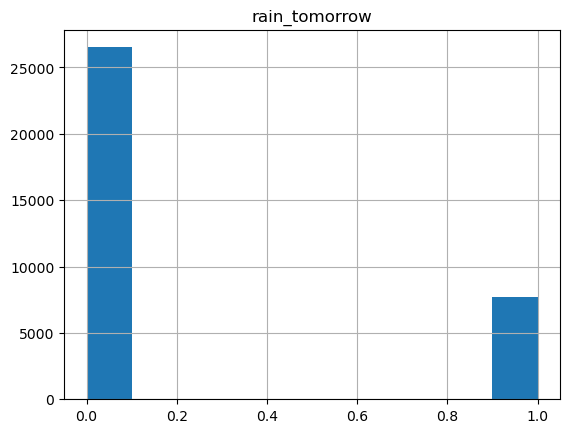

In [13]:
# Guess everything as "survived"
print(round(1 - train[TARGET].mean(), 2))
train.hist(TARGET)
plt.show()

# Data Profile

In [ ]:
all_cat_features = train.

In [19]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34191 entries, 0 to 34190
Data columns (total 24 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               34191 non-null  int64  
 1   date             34191 non-null  object 
 2   location         34191 non-null  object 
 3   min_temp         34034 non-null  float64
 4   max_temp         34121 non-null  float64
 5   rainfall         33834 non-null  float64
 6   evaporation      416 non-null    object 
 7   sunshine         625 non-null    object 
 8   wind_gust_dir    31906 non-null  object 
 9   wind_gust_speed  31920 non-null  float64
 10  wind_dir9am      31759 non-null  object 
 11  wind_dir3pm      33250 non-null  object 
 12  wind_speed9am    33863 non-null  float64
 13  wind_speed3pm    33541 non-null  float64
 14  humidity9am      33738 non-null  float64
 15  humidity3pm      33294 non-null  float64
 16  pressure9am      30810 non-null  float64
 17  pressure3pm 

In [15]:
profile = ProfileReport(train, title="Pandas Profiling Report")

In [17]:
profile.to_notebook_iframe()